## Data Collection

<h4>Data sources</h4>
<li>List of New York counties (<a href="https://www.newyork-demographics.com/counties_by_population">https://www.newyork-demographics.com/counties_by_population</a>)</li>
<li>Population of counties - 2020 census (same source as above)</li>
<li>GeoJson file with county boundaries (File cugir-007865-geojson.json)</li>
<li>Covid cases (new cases, cumulative cases) by county (available from <a href="https://health.data.ny.gov/Health/New-York-State-Statewide-COVID-19-Testing/xdss-u53e">https://health.data.ny.gov/Health/New-York-State-Statewide-COVID-19-Testing/xdss-u53e</a> using the <a href="https://dev.socrata.com">Socrata Open Data API</a>)</li>

In [1]:
import pandas as pd
import numpy as np
import folium
import json
from functools import reduce
import warnings
warnings.filterwarnings('ignore')

### The code below can return the population of different counties of New York State

In [2]:
population_and_county = pd.read_html("https://www.newyork-demographics.com/counties_by_population")#Get this dataframe
population_and_county_df = population_and_county[0]
population_and_county_df['County'] = population_and_county_df['County'].apply(lambda x : x.replace(' County', ''))
population_and_county_df.drop([len(population_and_county_df)-1],inplace=True)
population_and_county_df

,Rank,County,Population
0,1,Kings,2736074
1,2,Queens,2405464
2,3,New York,1694251
3,4,Suffolk,1525920
4,5,Bronx,1472654
...,...,...,...
57,58,Schoharie,29714
58,59,Lewis,26582
59,60,Yates,24774
60,61,Schuyler,17898


### The code below returns the covid 19 data of new york state

In [3]:
import re
counties = list(population_and_county_df["County"])

df_list = []
count = 0
while count < len(counties):
    for county in counties:
        county = county.replace(" ", "+")
        url = 'https://health.data.ny.gov/resource/xdss-u53e.json?county=' + county
        df_county = pd.read_json(url)
        df_list.append(df_county)
        count += 1


In [4]:
#Get Covid case data from Socrata API
data_merge = reduce(lambda left, right: pd.concat([left, right]), df_list)
population_and_county_df_sub = population_and_county_df[['County', 'Population']].rename(columns = {'County':'county'})
df = data_merge.join(population_and_county_df_sub.set_index('county'), on = 'county')
df


,test_date,county,new_positives,cumulative_number_of_positives,total_number_of_tests,cumulative_number_of_tests,Population
0,2020-03-01T00:00:00.000,Kings,0,0,0,0,2736074
1,2020-03-02T00:00:00.000,Kings,0,0,0,0,2736074
2,2020-03-03T00:00:00.000,Kings,0,0,2,2,2736074
3,2020-03-04T00:00:00.000,Kings,1,1,4,6,2736074
4,2020-03-05T00:00:00.000,Kings,0,1,7,13,2736074
...,...,...,...,...,...,...,...
753,2022-03-24T00:00:00.000,Hamilton,2,870,16,17597,5107
754,2022-03-25T00:00:00.000,Hamilton,0,870,28,17625,5107
755,2022-03-26T00:00:00.000,Hamilton,0,870,24,17649,5107
756,2022-03-27T00:00:00.000,Hamilton,0,870,7,17656,5107


In [5]:
df.reset_index(drop=True)

,test_date,county,new_positives,cumulative_number_of_positives,total_number_of_tests,cumulative_number_of_tests,Population
0,2020-03-01T00:00:00.000,Kings,0,0,0,0,2736074
1,2020-03-02T00:00:00.000,Kings,0,0,0,0,2736074
2,2020-03-03T00:00:00.000,Kings,0,0,2,2,2736074
3,2020-03-04T00:00:00.000,Kings,1,1,4,6,2736074
4,2020-03-05T00:00:00.000,Kings,0,1,7,13,2736074
...,...,...,...,...,...,...,...
46991,2022-03-24T00:00:00.000,Hamilton,2,870,16,17597,5107
46992,2022-03-25T00:00:00.000,Hamilton,0,870,28,17625,5107
46993,2022-03-26T00:00:00.000,Hamilton,0,870,24,17649,5107
46994,2022-03-27T00:00:00.000,Hamilton,0,870,7,17656,5107


### GeoJson file with county boundaries (File cugir-007865-geojson.json)

In [6]:
#Create a geojson data object from the county geojson file
county_geojson_file = "cugir-007865-geojson.json"
f = open(county_geojson_file,'r')
content = f.read()

import json
geojson_data = json.loads(content)

## Exploratory data analysis and data visualization

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
new_df = df[['test_date', 'county', 'new_positives', 'total_number_of_tests', 'Population']]
new_df.reset_index(drop = True)

,test_date,county,new_positives,total_number_of_tests,Population
0,2020-03-01T00:00:00.000,Kings,0,0,2736074
1,2020-03-02T00:00:00.000,Kings,0,0,2736074
2,2020-03-03T00:00:00.000,Kings,0,2,2736074
3,2020-03-04T00:00:00.000,Kings,1,4,2736074
4,2020-03-05T00:00:00.000,Kings,0,7,2736074
...,...,...,...,...,...
46991,2022-03-24T00:00:00.000,Hamilton,2,16,5107
46992,2022-03-25T00:00:00.000,Hamilton,0,28,5107
46993,2022-03-26T00:00:00.000,Hamilton,0,24,5107
46994,2022-03-27T00:00:00.000,Hamilton,0,7,5107


In [9]:
county_total_test =  pd.DataFrame(new_df.groupby("county")['total_number_of_tests'].sum())
county_total_test

,total_number_of_tests
county,
Albany,1233260
Allegany,227822
Bronx,7378603
Broome,1022189
Cattaraugus,274749
...,...
Washington,243283
Wayne,330141
Westchester,5017476


<AxesSubplot:xlabel='county'>

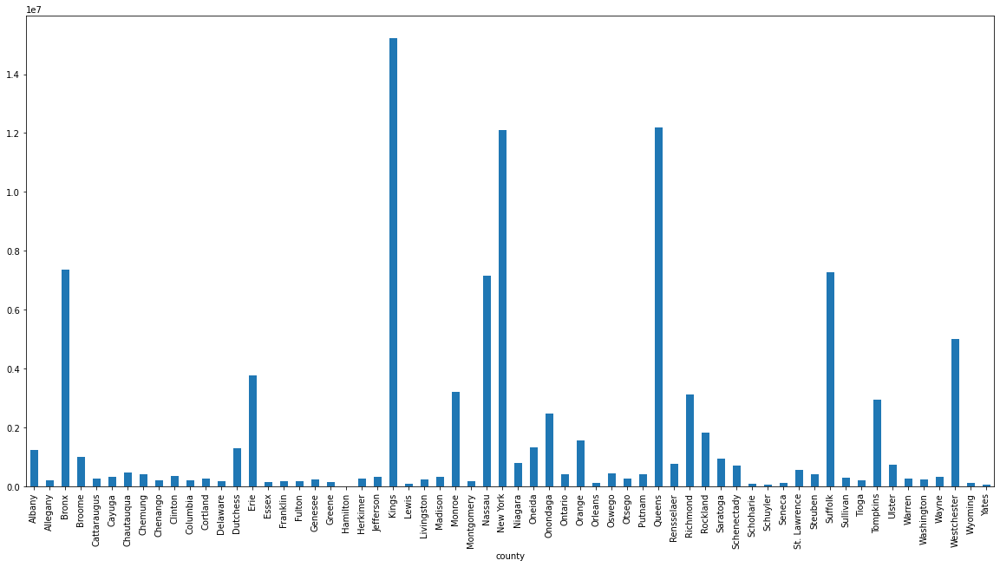

In [10]:
county_total_test['total_number_of_tests'].plot(kind = 'bar', figsize=(20,10))

In [11]:
county_sum = pd.DataFrame(new_df.groupby("county")['new_positives'].sum())
county_sum

,new_positives
county,
Albany,58745
Allegany,8907
Bronx,394783
Broome,44993
Cattaraugus,15390
...,...
Washington,12020
Wayne,17125
Westchester,249795


<AxesSubplot:xlabel='county'>

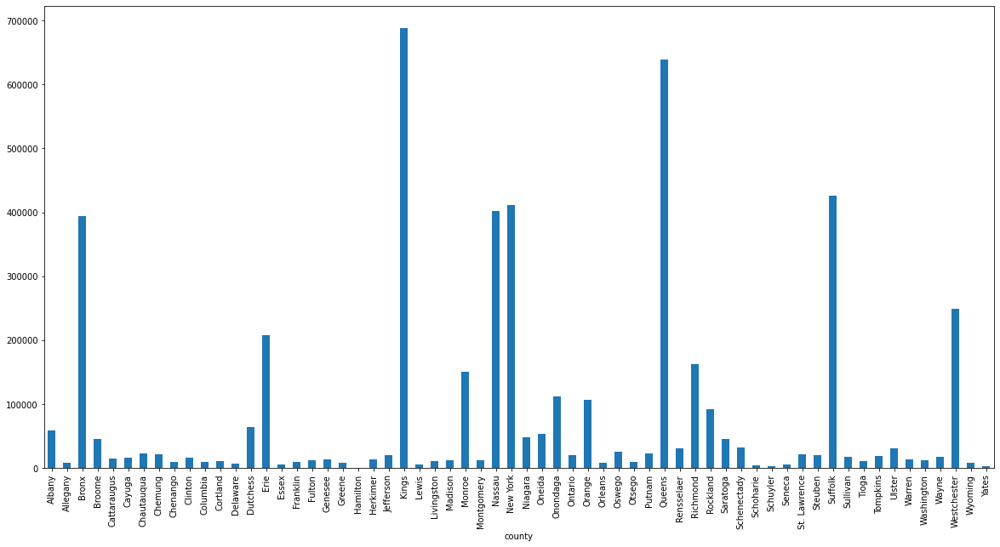

In [12]:
county_sum['new_positives'].plot(kind = 'bar', figsize=(20,10))

In [13]:
county_total = pd.concat([county_total_test, county_sum],axis=1)
county_total['covid_ratio'] = county_total['new_positives'] / county_total['total_number_of_tests'] * 100
sort_county = county_total.sort_values('covid_ratio', ascending = False)
sort_county

,total_number_of_tests,new_positives,covid_ratio
county,,,
Orange,1566083,106270,6.785720
Lewis,90987,6129,6.736127
Fulton,196643,12534,6.373987
Sullivan,288511,18324,6.351231
Orleans,138082,8578,6.212251
...,...,...,...
Cortland,273758,10540,3.850116
St. Lawrence,556327,21021,3.778533
Otsego,269337,9849,3.656757


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61],
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(

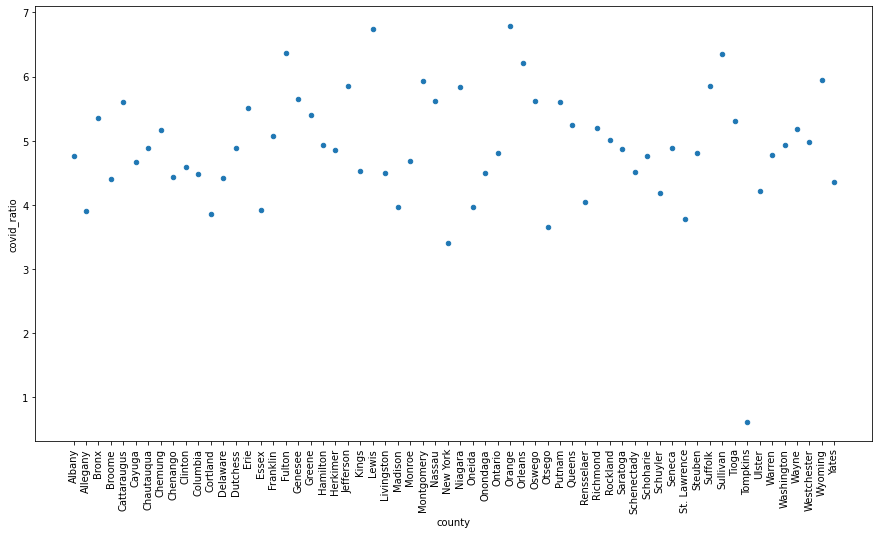

In [14]:
county_total.reset_index().plot(x = 'county', y = 'covid_ratio', kind = 'scatter', figsize = (15, 8))
plt.xticks(rotation = 90)


### Some takeaways:
- As can be seen from the plot, the county Kings has the most positive cases.
- County Orange has the highest covid-19 positive ratio

## Map 1

The first map looks at the total number of positive cases in each county adjusted for population (incidence). The resulting choropleth map will show which counties were the hardest hit by Covid-19 from the start of the pandemic till the last data date.

In [15]:
#Extract the data for the last date for each county (use groupby, last, and reset_index)
lasts = df.groupby('county').last().reset_index()

#Calculate the incidence (cases/population)
lasts['incidence'] = lasts['cumulative_number_of_positives'].astype(int) / lasts['Population'].astype(int)

#Draw the folium map. 
import folium

m = folium.Map(location=[43.2994, -74.2179],zoom_start=6) #Figure out a center and zoom level for the map

#Source for county geojson: https://cugir.library.cornell.edu/catalog/cugir-007865
c = folium.Choropleth(geo_data='cugir-007865-geojson.json',  
                      data=lasts, 
                     columns=['county', 'incidence'], 
                      key_on='feature.properties.name', 
                      fill_color='YlOrRd', 
                      fill_opacity=0.2, 
                      legend_name="Distribution of incidence",
                     highlight=True).add_to(m) 

c.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'],labels=False)
)
m.save("latest_day_ny_covid_19_map.html")
m

## Map 2

The second map constructs a time slider choropleth map using the same data as in map 1 with the difference that the output is a map for each day between March 1st 2020 and the latest data date. To smooth out noise, rather than plotting the raw incidence for each day, I plot the 8 day moving average of the daily incidence (incidence = cases/population).

In [16]:
df['incidence'] = df['new_positives'].astype(int) / df['Population'].astype(int) #new cases/population
df['ma8'] = df.groupby('county')['incidence'].transform(lambda x: x.rolling(8).mean()).fillna(0) #8 day moving average. Note that you need to do this for each county separately

#Convert test_date to unixtime
df['test_date'] = (pd.to_datetime(df['test_date']) + pd.Timedelta(1,'d')).view(int) //(10 ** 9)

#Make a color map
import branca.colormap as cm
max_value = df['ma8'].max()#The highest ma8 value in df
min_value = df['ma8'].min()#The lowest ma8 value in df
cmap = cm.linear.YlOrRd_09.scale(min_value, max_value) 
df['color'] = df["ma8"].map(cmap)
df['opacity'] = 0.5

#Map each county to a unique value 0,1,2, etc.
#Make sure the 0, 1, 2 etc are str objects not ints
county_mapping = dict()
county_name = population_and_county_df['County'].unique().tolist()

for county in county_name:
    county_mapping[county] = county_name.index(county)

#Rename the "county" column to "county_name"
#Then create a new column "county" that contains the county numbers
#Make this column the index
df.reset_index()
df['county_name'] = df['county']
df['county'] = df.county.map(county_mapping) 

#Update the geojson file (change counties to "0", "1", "2", ....)
#Look at the structure of geojson_data and try to figure out how to do this
#CODE FOR MODIFYING geojson_data goes here
county_geojson_file = "cugir-007865-geojson.json"
f = open(county_geojson_file,'r')
content = f.read()

geojson_data = json.loads(content)
for feature in geojson_data['features']:
    name = feature['properties']['name']
    if name in county_mapping.keys():
        feature['id'] = county_mapping[name]


#Create styledict
styledict = dict()
df.set_index("county",inplace=True)
for county in df.index.unique():
    df2 = df[df.index == county][['test_date', 'color', 'opacity']].set_index('test_date')
    styledict[county] = df2.to_dict(orient = 'index')


#Render the map
import folium,json
from folium.plugins import TimeSliderChoropleth
m = folium.Map([42, -78],  zoom_start=6)

g = TimeSliderChoropleth(
    geojson_data, 
    styledict=styledict, 
).add_to(m)


m.save("Map 2.html")

m

## Map 3

An alternative way at looking at the data would be to construct daily choropleth maps that focused on the relative incidence of Covid-19 across counties on any given day. One way to do this is to rank the counties by the incidence levels for each day separately. In the third choropleth map, I construct a time slider choropleth map which uses the 8 day moving average of these daily ranks (highest to lowest). Public health officials will find this more useful than the map 2 because they can move resources (testing kits, hospital supplies, treatments, etc.) to the counties with a higher incidence even when overall cases are quire low.

In [17]:
#Calculate relative indices by date
df.reset_index(inplace=True)
inc_sum_df = df.groupby('test_date')['incidence'].sum().reset_index()
#A function for calculating the incidence
def pct_incidence(x):
    #Your code goes here
    temp = [ ]
    for i in range(len(x)):
        temp.append(x['incidence'][i]/inc_sum_df[inc_sum_df['test_date'] == x['test_date'][i]]['incidence'].values[0] * 100) 
    
    return temp
        
#Calculate relative incidence
df['relative_incidence'] = pct_incidence(df)
df.fillna(0)

#Calculate rank and 8 day moving average
df['rank'] = df.groupby(['county'])['relative_incidence'].rank()
df.fillna(0)

df['rma8'] = df.groupby('county')['rank'].transform(lambda x: x.rolling(8).mean()).fillna(0) 

#Use branca to get colors (constant opacity)
import branca.colormap as cm
max_value = df['rma8'].max()#The highest ma8 value in df
min_value = df['rma8'].min()#The lowest ma8 value in df
cmap = cm.linear.YlOrRd_09.scale(min_value, max_value) 
df['color'] = df["rma8"].map(cmap)
df['opacity'] = 0.5


#Draw the map
#Create a styledict
#Get the center and the zoom
#Create a TimeSliderChoropleth map
#Render and save it
styledict = dict()
df.set_index("county",inplace=True)
for county in df.index.unique():
    df2 = df[df.index == county][['test_date', 'color', 'opacity']].set_index('test_date')
    styledict[county] = df2.to_dict(orient = 'index')


    
#Render the map
import folium,json
from folium.plugins import TimeSliderChoropleth
m = folium.Map([42, -78],  zoom_start=6)

g = TimeSliderChoropleth(
    geojson_data, 
    styledict=styledict, 

).add_to(m)


m.save("rincidence.html")

m
